# Product Recognition on Store Shelves
### Introduction:
Object detection techniques based on computer vision can be deployed in super market scenarios for the
creation of a system capable of recognizing products on store shelves. 
Given the image of a store shelf, such a system should be able identify the different products present 
therein and may be deployed, e.g. to help visually impaired costumers or to automate some common store
management tasks (e.g. detect low in stock or misplaced products).

### Overall Task:
Develop a computer vision system that, given a reference image for each product, is able to identify boxes 
of cereals of different brands from one picture of a store shelf. For each type of product displayed in the 
shelf the system should report:

1. Number of instances.
2. Dimension of each instance (width and height of the bounding box that enclose them in pixel).
3. Position in the image reference system of each instance (center of the bounding box that enclose 
them in pixel).

# Imported Libraries and Classes

In [6]:
# Imported Libraries
import numpy as np
import cv2
import matplotlib.pyplot as plt
#plt.style.use('default')
from os import listdir
import cmasher as cmr

import warnings
warnings.filterwarnings("ignore")

# Imported Classes
#from matchers import FeatureMatcher, MultipleInstanceMatcher
from utils import visualize_detections, find_matcher_matrix, find_bboxes, print_detections

# Images Path
scene_folder = './images/scenes/'
model_folder = './images/models/'


#  Material Overview

## Model images

contains one reference image for each product that the system should be able to identify.

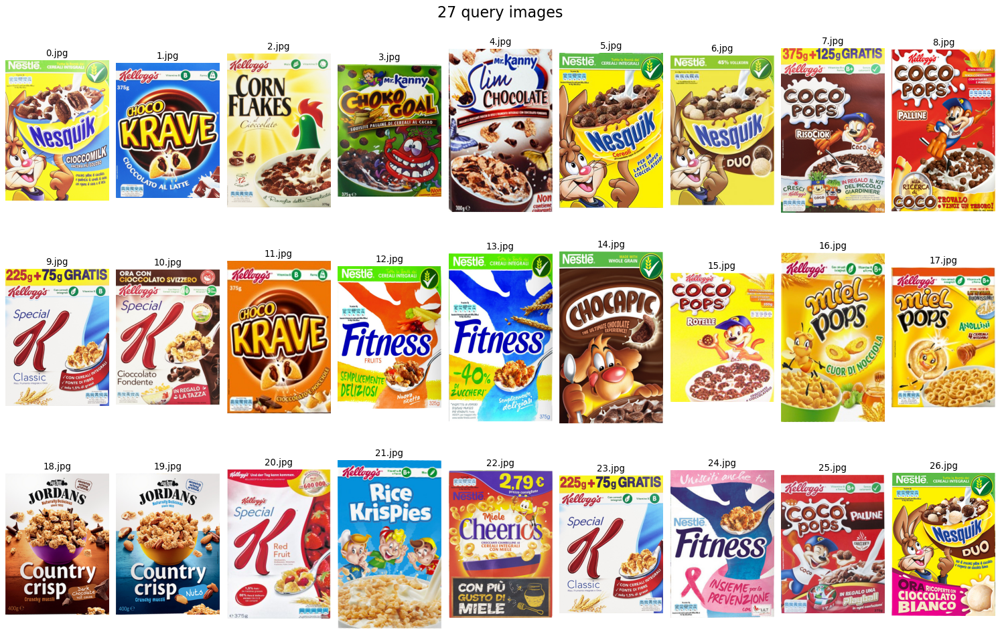

In [7]:
# Dictionary of models converted from BGR to RGB and sorted
models_props = [{'name': name, 'im': cv2.cvtColor(cv2.imread(model_folder + name), cv2.COLOR_BGR2RGB)} for name in listdir(model_folder)]
models_props.sort(key = lambda x: int(x['name'].split('.')[0]))

# List of models
model_images = [x['im'] for x in models_props]

# Setting of values for printing models
w, h, dpi = 1500, 1000, 80
fig, axs = plt.subplots(nrows = 3, ncols = 9, dpi = dpi, figsize = (w/dpi, h/dpi))

# Print the list of models
for image_data, ax in zip(models_props, axs.ravel()):
    ax.imshow(image_data['im'])
    ax.set_title(image_data['name'])
    ax.set_axis_off()
fig.suptitle(f'{len(models_props)} query images', fontsize = 20)
fig.tight_layout(pad = 1)
#fig.savefig('./images/results/model_summary.png')
plt.show()

## Scene images

contains 15 different shelve picture to test the algorithm developed in different scenarios.

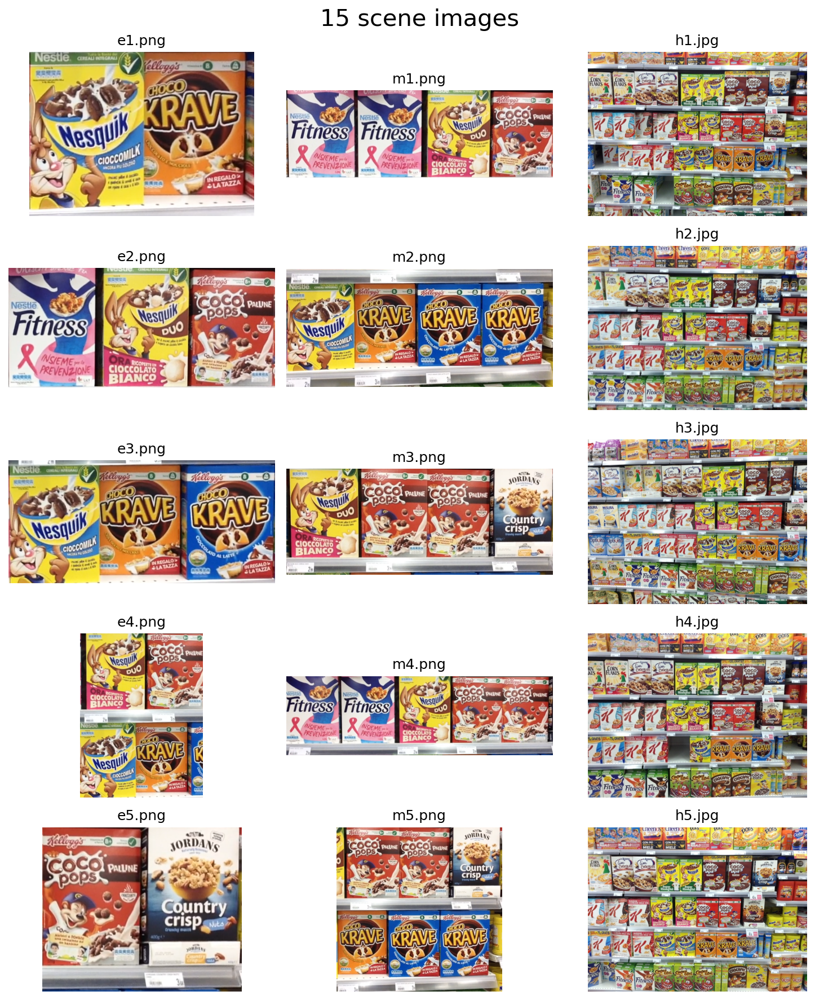

In [8]:
# Dictionary of scenes converted from BGR to RGB
scene_props = [{'name': name, 'im': cv2.cvtColor(cv2.imread(scene_folder + name), cv2.COLOR_BGR2RGB)} for name in listdir(scene_folder) if not 'h' in name]
scene_props += [{'name': name, 'im': cv2.cvtColor(cv2.imread(scene_folder + name), cv2.COLOR_BGR2RGB)} for name in listdir(scene_folder) if 'h' in name]

# List of scenes
scene_images = [x['im'] for x in scene_props]

# Setting of values for printing scenes
w, h, dpi = 1500, 1800, 150
fig, axs = plt.subplots(ncols = 3, nrows = 5, dpi = dpi, figsize = (w/dpi, h/dpi))

# Print the list of scenes
for image_data, ax in zip(scene_props, axs.T.ravel()):
    ax.imshow(image_data['im'])
    ax.set_title(image_data['name'])
    ax.set_axis_off()
fig.suptitle(f'{len(scene_props)} scene images', fontsize = 20)
fig.tight_layout(pad = 1)
fig.savefig('./images/results/scene_summary.png')
plt.show()

# Step A - Multiple Product Detection:

Develop an object detection system to identify single instance of products given: one reference image for 
each item and a scene image. The system should be able to correctly identify all the product in the shelves
image. One way to solve this task could be the use of local invariant feature as explained in lab session 5.

**It will have to be performed on the following materials:**

Test on scene image: {e1.png, e2.png, e3.png, e4.png, e5.png}

Use product images: {0.jpg, 1.jpg, 11.jpg, 19.jpg, 24.jpg, 26.jpg, 25.jpg}

## Read images

In [22]:
# Lists with the scenes and models of Step A
model_filenames = [f'{i}.jpg' for i in (0, 1, 11, 19, 24, 25, 26)]
scene_filenames = [f'e{i+1}.png' for i in range(5)]

#read images
im_model_list = [cv2.cvtColor(cv2.imread(model_folder + name), cv2.COLOR_BGR2RGB) for name in model_filenames]
im_scene_list = [cv2.cvtColor(cv2.imread(scene_folder + name), cv2.COLOR_BGR2RGB) for name in scene_filenames]

#resize model images
im_model_list = [cv2.resize(im, (480, 720)) for im in im_model_list]

## Compute matches between each pair of scene and model image

In [23]:
#set the ransac reprojection threshold when computing the homography
homography_kw = dict(ransacReprojThreshold = 1.)

#compute matcher matrix
matcher_matrix = find_matcher_matrix(im_scene_list, im_model_list, K=15, multiple_instances=False, homography_kw=homography_kw)

## Visualize detections

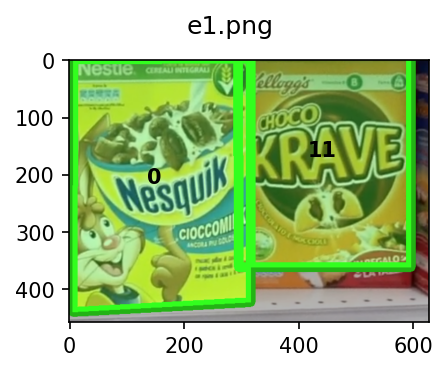

	Product 0 - 1 instance found:
		Instance  1 (position: (165, 216), width: 310px, height: 432px)
	Product 11 - 1 instance found:
		Instance  1 (position: (445, 168), width: 300px, height: 390px)


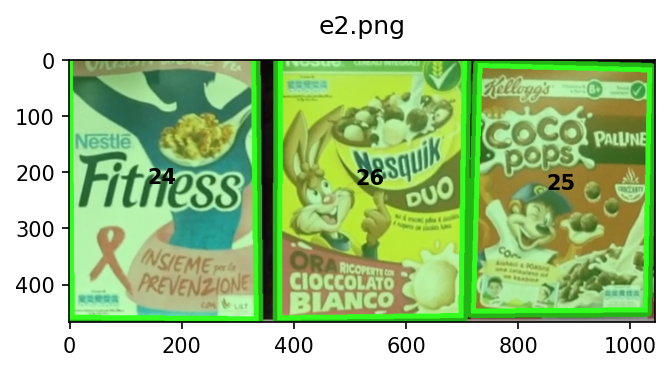

	Product 24 - 1 instance found:
		Instance  1 (position: (168, 220), width: 335px, height: 489px)
	Product 25 - 1 instance found:
		Instance  1 (position: (881, 230), width: 312px, height: 440px)
	Product 26 - 1 instance found:
		Instance  1 (position: (540, 221), width: 334px, height: 487px)


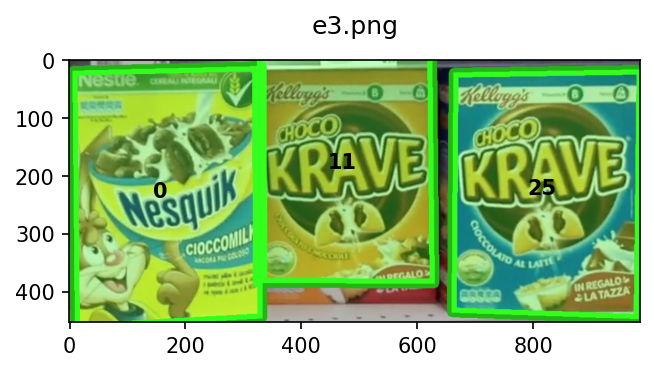

	Product 0 - 1 instance found:
		Instance  1 (position: (173, 237), width: 324px, height: 440px)
	Product 11 - 1 instance found:
		Instance  1 (position: (476, 187), width: 303px, height: 398px)
	Product 25 - 1 instance found:
		Instance  1 (position: (821, 233), width: 322px, height: 421px)


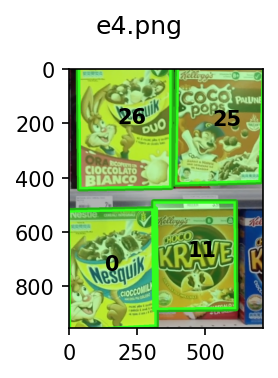

	Product 0 - 1 instance found:
		Instance  1 (position: (161, 740), width: 325px, height: 439px)
	Product 11 - 1 instance found:
		Instance  1 (position: (464, 690), width: 302px, height: 397px)
	Product 25 - 1 instance found:
		Instance  1 (position: (556, 206), width: 318px, height: 441px)
	Product 26 - 1 instance found:
		Instance  1 (position: (207, 199), width: 342px, height: 494px)


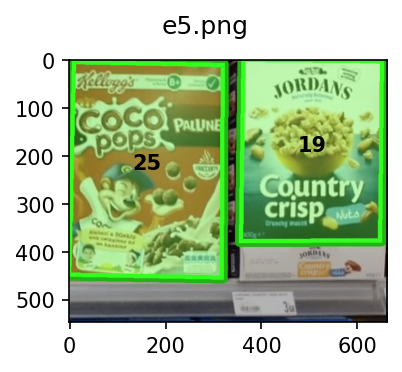

	Product 19 - 1 instance found:
		Instance  1 (position: (505, 190), width: 297px, height: 384px)
	Product 25 - 1 instance found:
		Instance  1 (position: (162, 228), width: 322px, height: 450px)


In [24]:
for i in range(len(im_scene_list)):
    scene_name = scene_filenames[i]
    bbox_props = find_bboxes(matcher_matrix[i], model_filenames, color_distance_threshold=15)
    fig, ax = visualize_detections(im_scene_list[i], bbox_props, plot_height=360)
    fig.suptitle(scene_name)
    fig.tight_layout(pad=0.5)
    fig.savefig('images/results/found_' + scene_name)
    plt.show()
    
    print_detections(bbox_props)

# Step B - Multiple Instance Detection:

In addition to what achieved at step A, the system should now be able to detect multiple instance of the 
same product. Purposely, students may deploy local invariant feature together with the GHT (Generalized 
Hough Transform). More precisely, rather than relying on the usual R-Table, the object model acquired at 
training time should now consist in vectors joining all the features extracted in the model image to their
barycenter; then, at run time all the image features matched with respect to the model would cast votes 
for the position of the barycenter by scaling appropriately the associated joining vectors (i.e. by the ratio of 
sizes between the matching features).

**It will have to be performed on the following materials:**

Test on scene image: {m1.png, m2.png, m3.png, m4.png, m5.png}

Use product images: {0.jpg, 1.jpg, 11.jpg, 19.jpg, 24.jpg, 26.jpg, 25.jpg}

## Read images

In [25]:
# Lists with the scenes and models of Step B
scene_filenames = [f'm{i+1}.png' for i in range(5)]
model_filenames = [f'{i}.jpg' for i in (0, 1, 11, 19, 24, 25, 26)]

# Read images
im_scene_list = [cv2.cvtColor(cv2.imread(scene_folder + name), cv2.COLOR_BGR2RGB) for name in scene_filenames]
im_model_list = [cv2.cvtColor(cv2.imread(model_folder + name), cv2.COLOR_BGR2RGB) for name in model_filenames]

#resize model images
im_model_list = [cv2.resize(im, (360, 480)) for im in im_model_list]

## Compute matches between each pair of scene and model image

In [26]:
#set the ransac reprojection threshold when computing the homography
homography_kw = dict(ransacReprojThreshold = 1.)
peaks_kw = dict(height = 0.3, distance = 0.05)

#compute matcher matrix
matcher_matrix = find_matcher_matrix(im_scene_list, im_model_list, K=15, peaks_kw=peaks_kw, homography_kw=homography_kw)

## Visualize detections

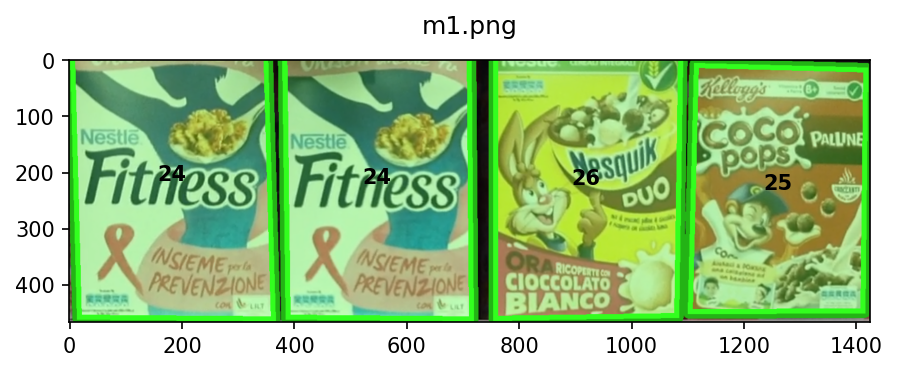

	Product 24 - 2 instance found:
		Instance  1 (position: (187, 214), width: 352px, height: 500px)
		Instance  2 (position: (552, 220), width: 336px, height: 490px)
	Product 25 - 1 instance found:
		Instance  1 (position: (1264, 230), width: 312px, height: 440px)
	Product 26 - 1 instance found:
		Instance  1 (position: (923, 221), width: 333px, height: 487px)


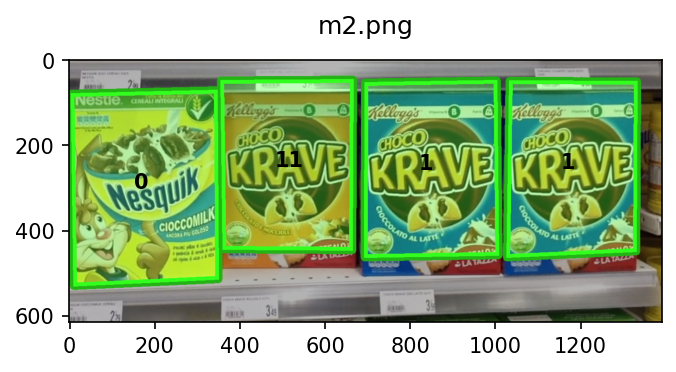

	Product 0 - 1 instance found:
		Instance  1 (position: (181, 302), width: 342px, height: 448px)
	Product 1 - 2 instance found:
		Instance  1 (position: (850, 256), width: 313px, height: 411px)
		Instance  2 (position: (1184, 254), width: 303px, height: 407px)
	Product 11 - 1 instance found:
		Instance  1 (position: (511, 251), width: 309px, height: 399px)


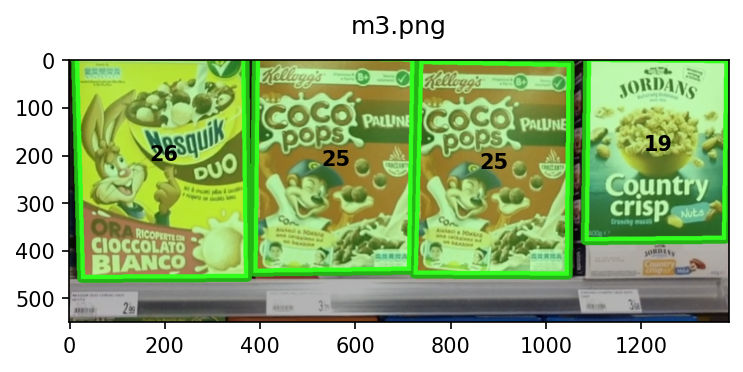

	Product 19 - 1 instance found:
		Instance  1 (position: (1235, 189), width: 296px, height: 382px)
	Product 25 - 2 instance found:
		Instance  1 (position: (558, 221), width: 332px, height: 453px)
		Instance  2 (position: (891, 227), width: 321px, height: 447px)
	Product 26 - 1 instance found:
		Instance  1 (position: (197, 210), width: 354px, height: 506px)


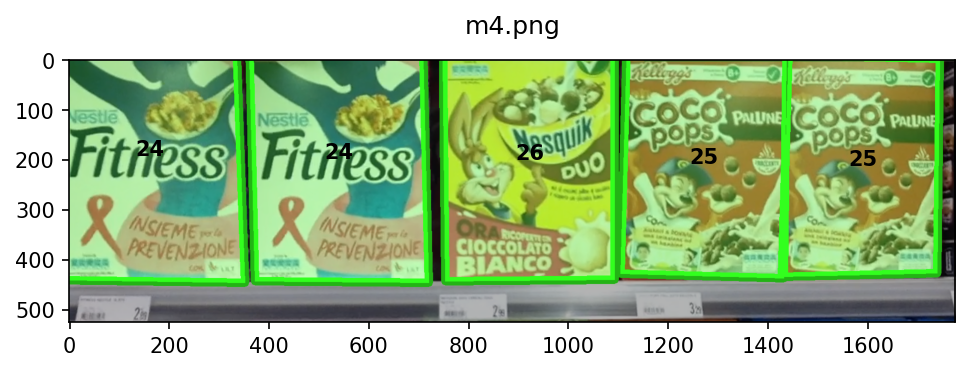

	Product 24 - 2 instance found:
		Instance  1 (position: (161, 191), width: 367px, height: 508px)
		Instance  2 (position: (542, 197), width: 348px, height: 499px)
	Product 25 - 2 instance found:
		Instance  1 (position: (1272, 207), width: 323px, height: 449px)
		Instance  2 (position: (1590, 212), width: 307px, height: 437px)
	Product 26 - 1 instance found:
		Instance  1 (position: (924, 198), width: 342px, height: 493px)


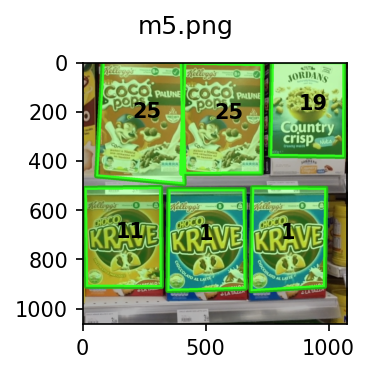

	Product 1 - 2 instance found:
		Instance  1 (position: (503, 719), width: 313px, height: 409px)
		Instance  2 (position: (837, 717), width: 301px, height: 412px)
	Product 11 - 1 instance found:
		Instance  1 (position: (164, 713), width: 308px, height: 404px)
	Product 19 - 1 instance found:
		Instance  1 (position: (910, 190), width: 297px, height: 384px)
	Product 25 - 2 instance found:
		Instance  1 (position: (233, 225), width: 340px, height: 486px)
		Instance  2 (position: (567, 228), width: 321px, height: 449px)


In [27]:
for i in range(len(im_scene_list)):
    scene_name = scene_filenames[i]
    bbox_props = find_bboxes(matcher_matrix[i], model_filenames, color_distance_threshold=5)
    fig, ax = visualize_detections(im_scene_list[i], bbox_props, plot_height=360)
    fig.suptitle(scene_name)
    fig.tight_layout(pad=0.5)
    fig.savefig('images/results/found_' + scene_name)
    plt.show()
    
    print_detections(bbox_props)


# Step C: like B but with all models and tougher scenes

## Upsample scene images with neural network: Initialize model 

In [15]:
### Initialization of Super Resolution 

train_dict = {1: ['fsrcnn', './weights/FSRCNN-small_x4.pb'],
              2: ['espcn', './weights/ESPCN_x4.pb'],
              3: ['edsr', './weights/EDSR_x4.pb'],
              4: ['lapsrn', './weights/LapSRN_x4.pb']}
nn_used = 3


sr = cv2.dnn_superres.DnnSuperResImpl_create()
sr.readModel(train_dict[nn_used][1])
sr.setModel(train_dict[nn_used][0], 4)

## Read images

In [29]:
# Lists with the scenes and models of Step B
scene_filenames = [f'h{i+1}.jpg' for i in range(5)]
model_filenames = [f'{i}.jpg' for i in range(27)]

# Read images
# im_scene_list = [cv2.cvtColor(cv2.imread(scene_folder + name), cv2.COLOR_BGR2RGB) for name in scene_filenames]
new_scene_folder = "images/results/upscaled_good/" #these images were created with the code lines below
im_scene_list = [cv2.cvtColor(cv2.imread(new_scene_folder + name), cv2.COLOR_BGR2RGB) for name in scene_filenames]
im_model_list = [cv2.cvtColor(cv2.imread(model_folder + name), cv2.COLOR_BGR2RGB) for name in model_filenames]

# resize model images
# im_model_list = [cv2.resize(im, (360, 480)) for im in im_model_list]
im_model_list = [cv2.GaussianBlur(im, (3*3, 3*3), 3) for im in im_model_list]
im_scene_list = [im[1100:, 1100:] for im in im_scene_list]

     
# upsample scene images
# im_scene_list = [sr.upsample(im) for im in im_scene_list]

# for im_scene, filename in zip(im_scene_list, scene_filenames):
#     cv2.imwrite(new_scene_folder + filename, cv2.cvtColor(im_scene, cv2.COLOR_RGB2BGR))


## Compute matches between each pair of scene and model image

In [30]:
#set the ransac reprojection threshold when computing the homography
homography_kw = dict(match_distance_threshold = 0.75, ransacReprojThreshold = 1.)
peaks_kw = dict(height = 0.3, distance = 0.05)

#compute matcher matrix
matcher_matrix = find_matcher_matrix(im_scene_list, im_model_list, K=15, peaks_kw=peaks_kw, homography_kw=homography_kw)

## Visualize detections

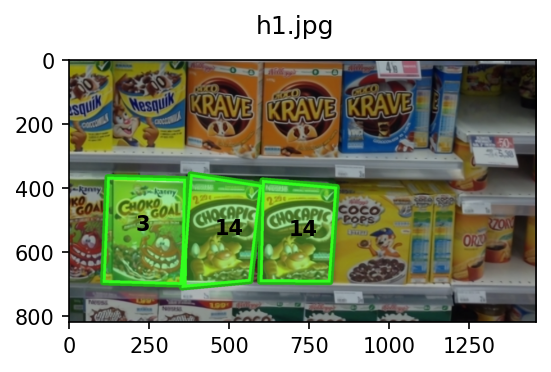

	Product 14 - 2 instance found:
		Instance  1 (position: (483, 545), width: 221px, height: 330px)
		Instance  2 (position: (716, 547), width: 228px, height: 308px)
	Product 3 - 1 instance found:
		Instance  1 (position: (238, 533), width: 249px, height: 331px)


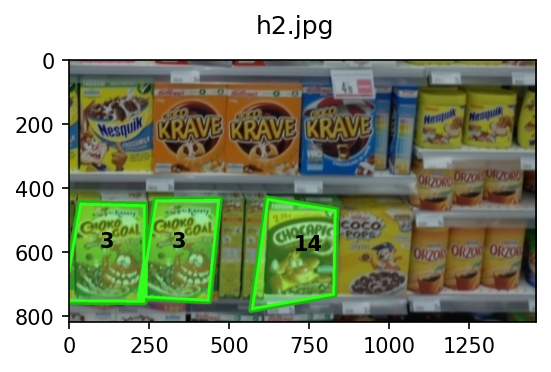

	Product 14 - 1 instance found:
		Instance  1 (position: (729, 594), width: 243px, height: 310px)
	Product 3 - 2 instance found:
		Instance  1 (position: (124, 587), width: 232px, height: 310px)
		Instance  2 (position: (349, 587), width: 210px, height: 316px)


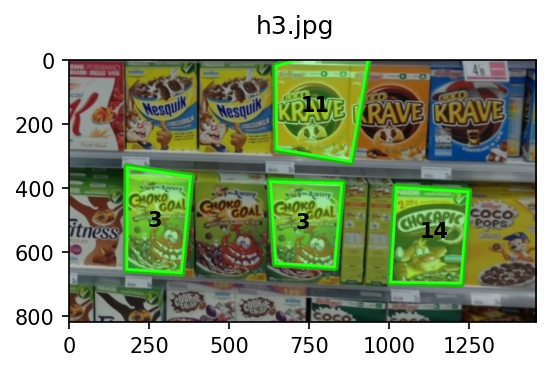

	Product 11 - 1 instance found:
		Instance  1 (position: (752, 160), width: 280px, height: 331px)
	Product 14 - 1 instance found:
		Instance  1 (position: (1125, 555), width: 229px, height: 298px)
	Product 3 - 2 instance found:
		Instance  1 (position: (275, 519), width: 192px, height: 317px)
		Instance  2 (position: (737, 527), width: 211px, height: 266px)


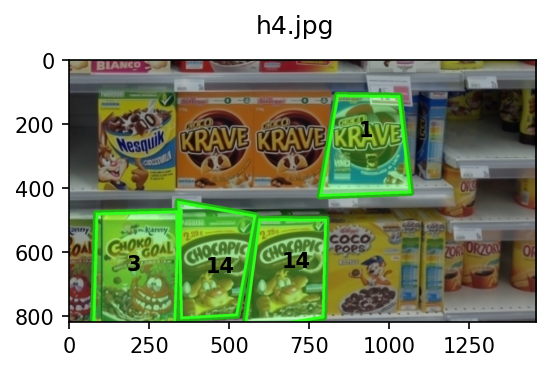

	Product 1 - 1 instance found:
		Instance  1 (position: (933, 239), width: 243px, height: 316px)
	Product 14 - 2 instance found:
		Instance  1 (position: (454, 664), width: 214px, height: 345px)
		Instance  2 (position: (692, 650), width: 234px, height: 332px)
	Product 3 - 1 instance found:
		Instance  1 (position: (209, 657), width: 262px, height: 360px)


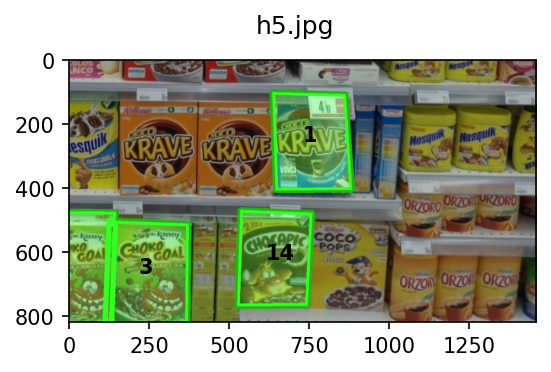

	Product 1 - 1 instance found:
		Instance  1 (position: (758, 254), width: 234px, height: 303px)
	Product 14 - 1 instance found:
		Instance  1 (position: (643, 624), width: 223px, height: 295px)
	Product 3 - 2 instance found:
		Instance  1 (position: (6, 667), width: 268px, height: 354px)
		Instance  2 (position: (246, 667), width: 253px, height: 323px)


In [31]:
for i in range(len(im_scene_list)):
    scene_name = scene_filenames[i]
    bbox_props = find_bboxes(matcher_matrix[i], model_filenames, color_distance_threshold=3, min_match_threshold=4)
    fig, ax = visualize_detections(im_scene_list[i], bbox_props, draw_invalid_bbox=1, plot_height=360)
    fig.suptitle(scene_name)
    fig.tight_layout(pad=0.5)
    fig.savefig('images/results/found_' + scene_name)
    plt.show()
    
    print_detections(bbox_props)
